# **Importing library&function**






In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization, Flatten
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.preprocessing import image_dataset_from_directory
from sklearn.preprocessing import OneHotEncoder
import numpy as np
import pandas as pd
import shutil
import time
import cv2 as cv2
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import os
import seaborn as sns
sns.set_style('darkgrid')
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score, mean_squared_error, auc
from IPython.core.display import display, HTML
import numpy as np
import time
import os
from google.colab import drive
import itertools

!pip install split_folders
import splitfolders

!pip install scikit-learn

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!ls /content/drive/MyDrive/ColabNotebooks/FinalProject/Dataset/types/
loc = "/content/drive/MyDrive/ColabNotebooks/FinalProject/Dataset/types/"

cataract  diabetic_retinopathy	glaucoma  normal


In [4]:
splitfolders.ratio(loc,output = "output1",ratio = (0.90,0.05,0.05))
for dirpath,dirname,filename in os.walk("./output1"):
  print(f"There are {len(dirname)} directories and {len(filename)} images in '{dirpath}'.")

Copying files: 4217 files [00:50, 83.80 files/s] 

There are 3 directories and 0 images in './output1'.
There are 4 directories and 0 images in './output1/train'.
There are 0 directories and 934 images in './output1/train/cataract'.
There are 0 directories and 906 images in './output1/train/glaucoma'.
There are 0 directories and 966 images in './output1/train/normal'.
There are 0 directories and 988 images in './output1/train/diabetic_retinopathy'.
There are 4 directories and 0 images in './output1/test'.
There are 0 directories and 53 images in './output1/test/cataract'.
There are 0 directories and 51 images in './output1/test/glaucoma'.
There are 0 directories and 55 images in './output1/test/normal'.
There are 0 directories and 56 images in './output1/test/diabetic_retinopathy'.
There are 4 directories and 0 images in './output1/val'.
There are 0 directories and 51 images in './output1/val/cataract'.
There are 0 directories and 50 images in './output1/val/glaucoma'.
There are 0 directories and 53 images in './output1/val/normal'.
Th

In [5]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor = "val_loss",patience = 6,
                                             min_delta = 0.0001)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = "val_loss",factor = 0.2,
                                                patience = 4,min_lr = 1e-7)

In [6]:
def predict_labels(model, X_test):
    return model.predict(X_test)

def display_classification_report(y_test, y_pred):
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

def calculate_specificity(y_test, y_pred):
    # tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    # specificity = tn / (tn + fp)
    # print(f"Specificity: {specificity}")
    cm = confusion_matrix(y_test, y_pred)
    specificity = []
    for i in range(cm.shape[0]):
      spec = cm[i, i] / (np.sum(cm[i, :]) - cm[i, i] + np.sum(cm[:, :]) - np.sum(cm[i, :]))
      specificity.append(spec)
    print(f"Specificity: {specificity}")

def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  """
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
    # Create the confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]  # normalize
    n_classes = cm.shape[0]  # find the number of classes

    specificity = []  # To store specificity values for each class

    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues)
    fig.colorbar(cax)

    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

    ax.set(
        title="Confusion Matrix",
        xlabel="Predicted label",
        ylabel="True label",
        xticks=np.arange(n_classes),
        yticks=np.arange(n_classes),
        xticklabels=labels,
        yticklabels=labels
    )

    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()

    plt.xticks(rotation=70, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    threshold = (cm.max() + cm.min()) / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        specificity_val = (cm.sum() - cm[i].sum() - cm[:, j].sum() + cm[i, j]) / (
            cm.sum() - cm[:, j].sum()
        )
        specificity.append(specificity_val)

        if norm:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%,\n {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%, Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )
        else:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ( {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} (Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )

    if savefig:
        fig.savefig("confusion_matrix.png")

    return specificity

def calculate_mse(y_test, y_probs, n_classes):
  y_true_onehot = tf.keras.utils.to_categorical(y_test, n_classes)
  mse = mean_squared_error(y_true_onehot, y_probs)
  print(f"Mean Squared Error: : {mse}")
  return y_true_onehot

def calculate_roc_auc_score(y_test, y_probs):
  auc_roc = roc_auc_score(y_test, y_probs, multi_class='ovr', average=None)
  average_auc_roc = np.mean(auc_roc)
  print(f"The average AUC-ROC is {average_auc_roc}")

# **Batch size: 16**

In [7]:
epoch = 20
batchsize = 16

In [8]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3794 files belonging to 4 classes.
Found 215 files belonging to 4 classes.
Found 208 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [9]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


52606240/52606240 [==============================] - 0s 0us/step


In [10]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d (  (None, 1536)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 32)                49184     
                                                                 
 dense_1 (Dense)             (None, 4)                 132       
                                                                 
 activation (Activation)     (None, 4)                 0     

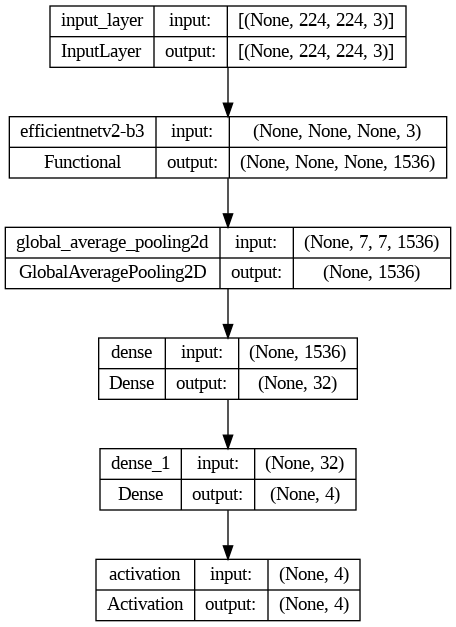

In [11]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [12]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [13]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
238/238 [==============================] - 30s 65ms/step - loss: 0.6161 - accuracy: 0.7562 - val_loss: 0.3770 - val_accuracy: 0.8798 - lr: 0.0010
Epoch 2/20
238/238 [==============================] - 12s 50ms/step - loss: 0.4263 - accuracy: 0.8503 - val_loss: 0.2874 - val_accuracy: 0.9038 - lr: 0.0010
Epoch 3/20
238/238 [==============================] - 12s 50ms/step - loss: 0.3723 - accuracy: 0.8579 - val_loss: 0.3098 - val_accuracy: 0.8750 - lr: 0.0010
Epoch 4/20
238/238 [==============================] - 12s 51ms/step - loss: 0.3311 - accuracy: 0.8698 - val_loss: 0.2835 - val_accuracy: 0.9038 - lr: 0.0010
Epoch 5/20
238/238 [==============================] - 12s 51ms/step - loss: 0.3061 - accuracy: 0.8861 - val_loss: 0.2528 - val_accuracy: 0.9183 - lr: 0.0010
Epoch 6/20
238/238 [==============================] - 12s 51ms/step - loss: 0.3040 - accuracy: 0.8811 - val_loss: 0.2209 - val_accuracy: 0.9087 - lr: 0.0010
Epoch 7/20
238/238 [==============================] - 12s 

EfficientNetV2B3 Evaluation

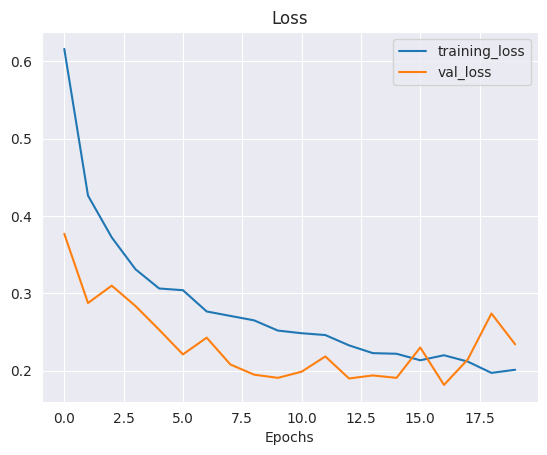

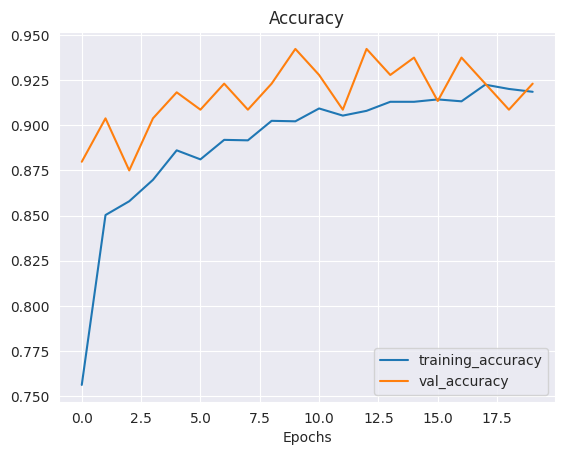

In [14]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 1s 44ms/step
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.92      0.96        53
           1       1.00      1.00      1.00        56
           2       0.85      0.88      0.87        51
           3       0.89      0.93      0.91        55

    accuracy                           0.93       215
   macro avg       0.94      0.93      0.93       215
weighted avg       0.94      0.93      0.94       215

Specificity: [0.29518072289156627, 0.3522012578616352, 0.2647058823529412, 0.31097560975609756]
Mean Squared Error: : 0.10583161562681198
The average AUC-ROC is 0.990247022081287


[0.9759036144578314,
 0.6666666666666666,
 0.6975308641975309,
 0.6645569620253164,
 0.6626506024096386,
 1.0,
 0.654320987654321,
 0.6455696202531646,
 0.6927710843373494,
 0.6792452830188679,
 0.9629629629629629,
 0.7151898734177216,
 0.6686746987951807,
 0.6540880503144654,
 0.6851851851851852,
 0.9746835443037974]

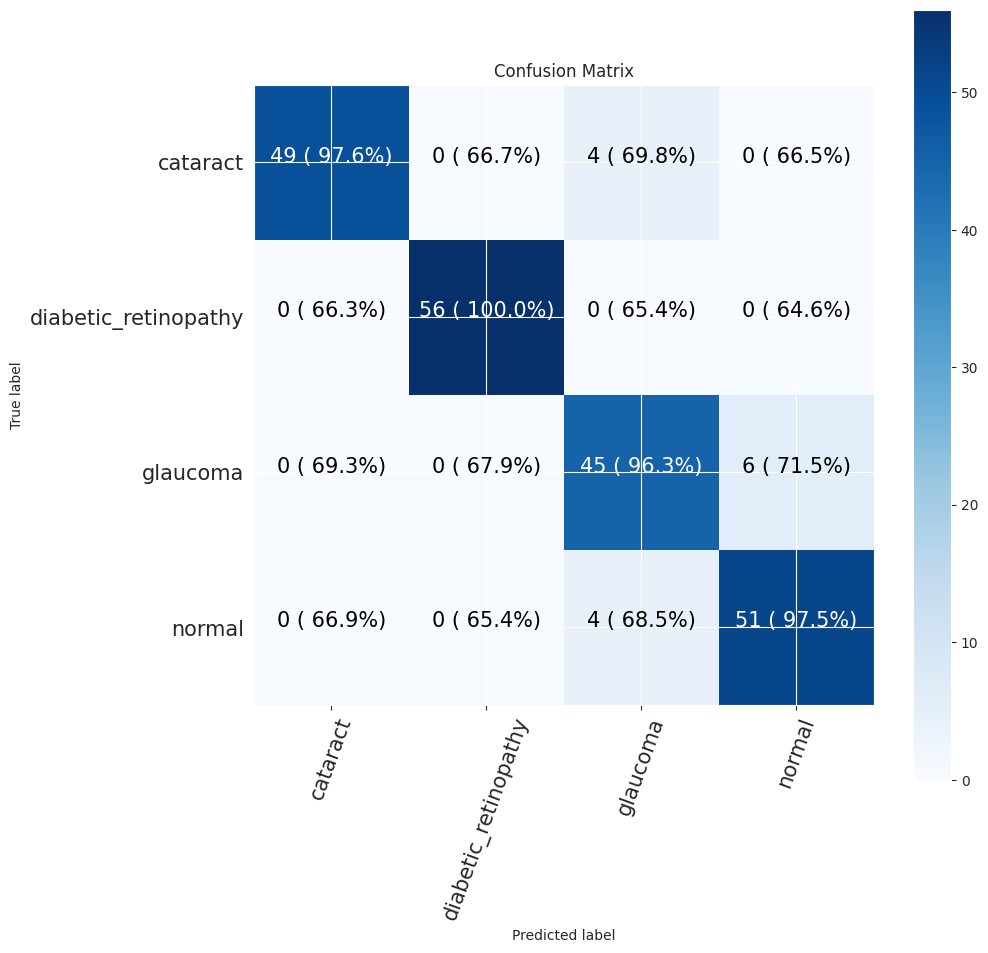

In [15]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


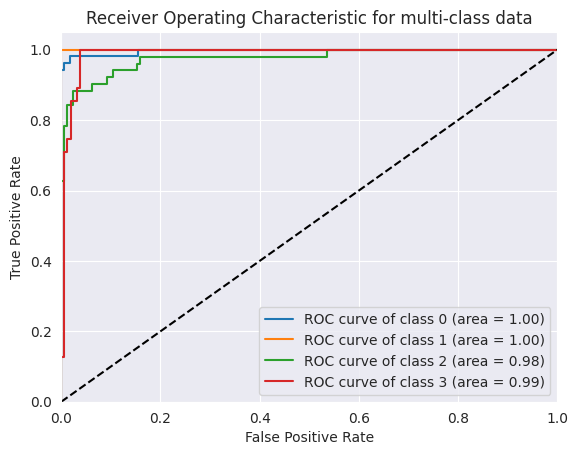

In [16]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [17]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# rbg = layers.Input(shape=(224, 224, 3))

# rbg = data_aug(rbg)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes


# Display model summary
cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 128)       0

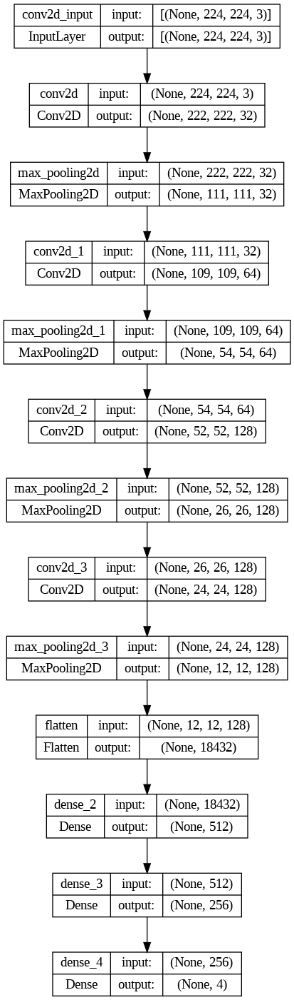

In [18]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [19]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [20]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
238/238 [==============================] - 12s 31ms/step - loss: 1.0262 - accuracy: 0.5996 - val_loss: 0.2898 - val_accuracy: 0.7019 - lr: 0.0010
Epoch 2/20
238/238 [==============================] - 7s 29ms/step - loss: 0.2865 - accuracy: 0.7069 - val_loss: 0.2842 - val_accuracy: 0.6971 - lr: 0.0010
Epoch 3/20
238/238 [==============================] - 7s 28ms/step - loss: 0.2760 - accuracy: 0.7222 - val_loss: 0.2736 - val_accuracy: 0.7308 - lr: 0.0010
Epoch 4/20
238/238 [==============================] - 7s 28ms/step - loss: 0.2837 - accuracy: 0.7148 - val_loss: 0.2633 - val_accuracy: 0.7212 - lr: 0.0010
Epoch 5/20
238/238 [==============================] - 7s 28ms/step - loss: 0.2725 - accuracy: 0.7317 - val_loss: 0.2509 - val_accuracy: 0.7163 - lr: 0.0010
Epoch 6/20
238/238 [==============================] - 7s 28ms/step - loss: 0.2589 - accuracy: 0.7486 - val_loss: 0.2581 - val_accuracy: 0.7308 - lr: 0.0010
Epoch 7/20
238/238 [==============================] - 7s 28ms/s

CNN Evaluation

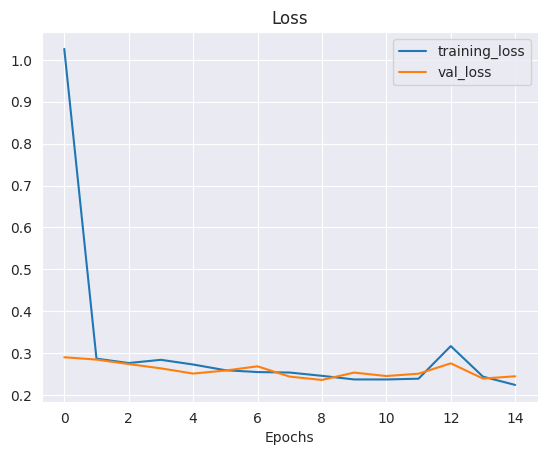

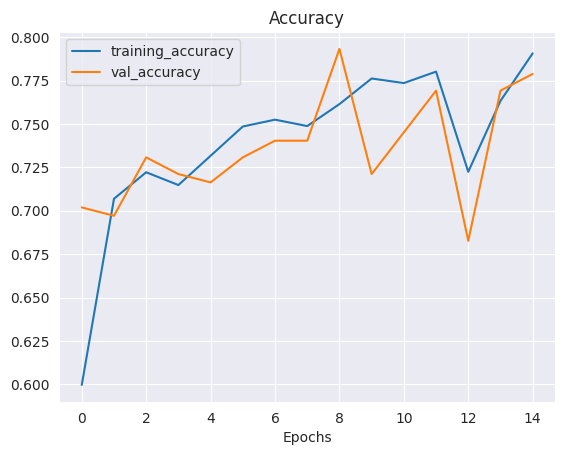

In [21]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 0s 9ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.45      0.51        53
           1       0.97      1.00      0.98        56
           2       0.56      0.45      0.50        51
           3       0.69      0.95      0.80        55

    accuracy                           0.72       215
   macro avg       0.70      0.71      0.70       215
weighted avg       0.71      0.72      0.71       215

Specificity: [0.1256544502617801, 0.3522012578616352, 0.11979166666666667, 0.31901840490797545]
Mean Squared Error: : 0.1329234093427658
The average AUC-ROC is 0.8979170578772337


[0.8333333333333334,
 0.6624203821656051,
 0.7931034482758621,
 0.7071428571428572,
 0.6781609195402298,
 1.0,
 0.6781609195402298,
 0.6,
 0.8045977011494253,
 0.6751592356687898,
 0.8390804597701149,
 0.7142857142857143,
 0.6839080459770115,
 0.6624203821656051,
 0.6896551724137931,
 0.9785714285714285]

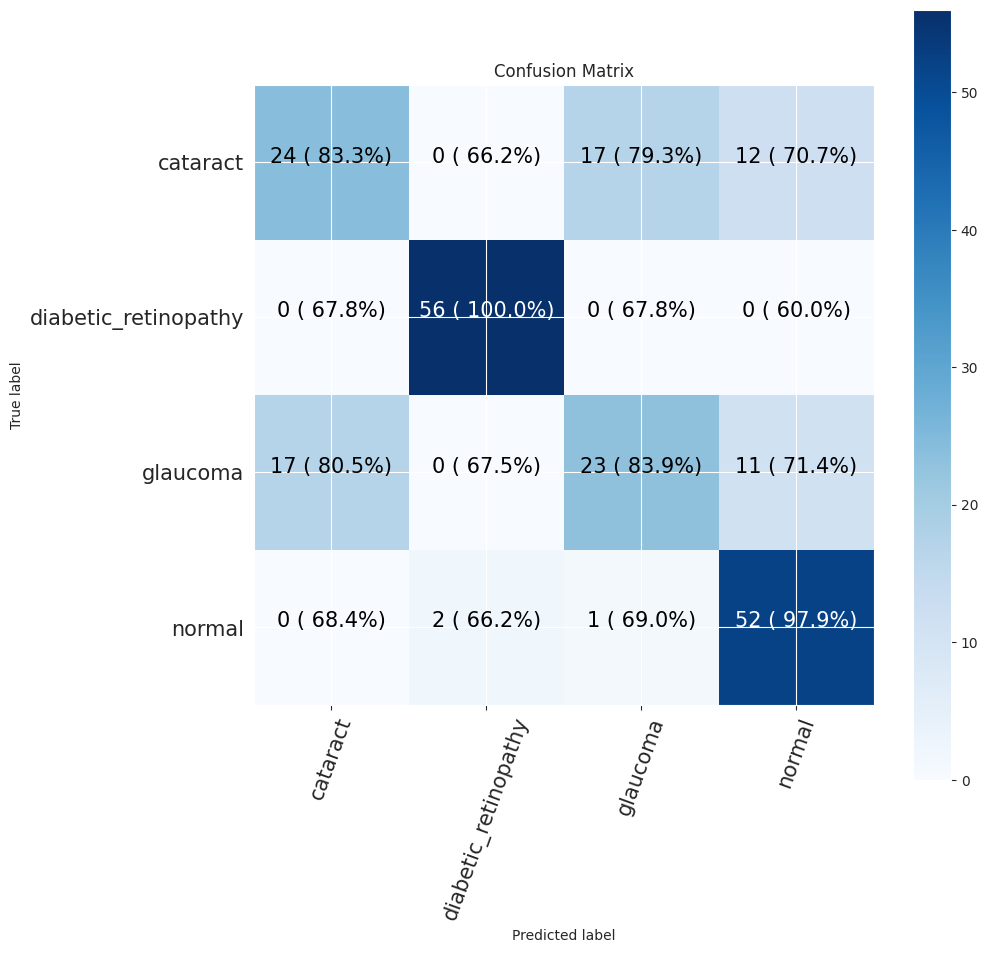

In [22]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


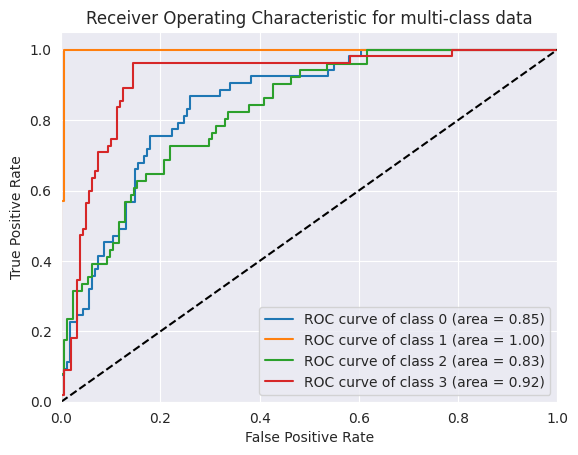

In [23]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [24]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [25]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

input = layers.Input(shape=(224, 224, 3))

conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


94765736/94765736 [==============================] - 0s 0us/step
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_4 (Conv2D)           (None, 224, 224, 3)       84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_5 (Dense)             (None, 1024)              2098176   
                                                                 
 dense_6 (Dense)             (None, 4)                 4100 

In [26]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

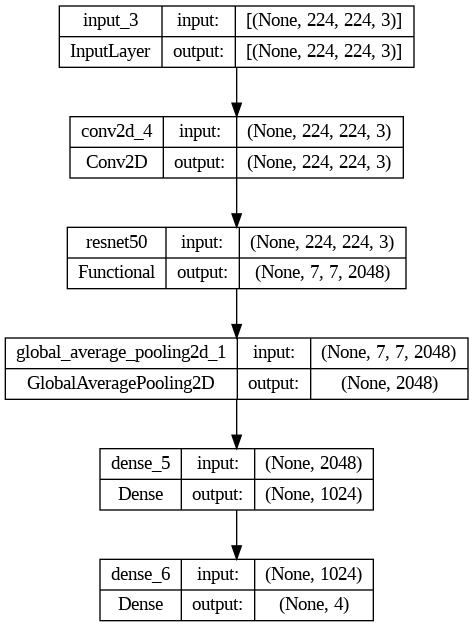

In [27]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [28]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [29]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
238/238 [==============================] - 41s 141ms/step - loss: 0.2852 - accuracy: 0.7707 - val_loss: 0.1915 - val_accuracy: 0.8558 - lr: 0.0010
Epoch 2/20
238/238 [==============================] - 31s 132ms/step - loss: 0.1654 - accuracy: 0.8735 - val_loss: 0.1514 - val_accuracy: 0.8894 - lr: 0.0010
Epoch 3/20
238/238 [==============================] - 31s 132ms/step - loss: 0.1394 - accuracy: 0.8938 - val_loss: 0.1792 - val_accuracy: 0.8558 - lr: 0.0010
Epoch 4/20
238/238 [==============================] - 32s 132ms/step - loss: 0.1233 - accuracy: 0.8993 - val_loss: 0.1244 - val_accuracy: 0.8798 - lr: 0.0010
Epoch 5/20
238/238 [==============================] - 32s 133ms/step - loss: 0.1063 - accuracy: 0.9164 - val_loss: 0.1330 - val_accuracy: 0.8942 - lr: 0.0010
Epoch 6/20
238/238 [==============================] - 31s 132ms/step - loss: 0.1061 - accuracy: 0.9157 - val_loss: 0.1341 - val_accuracy: 0.8846 - lr: 0.0010
Epoch 7/20
238/238 [==============================] 

ResNet50 Evaluation

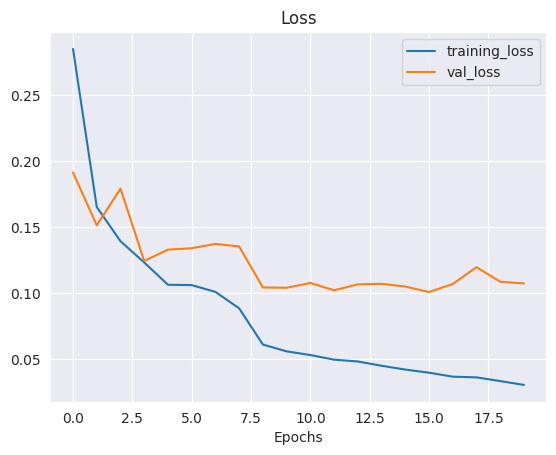

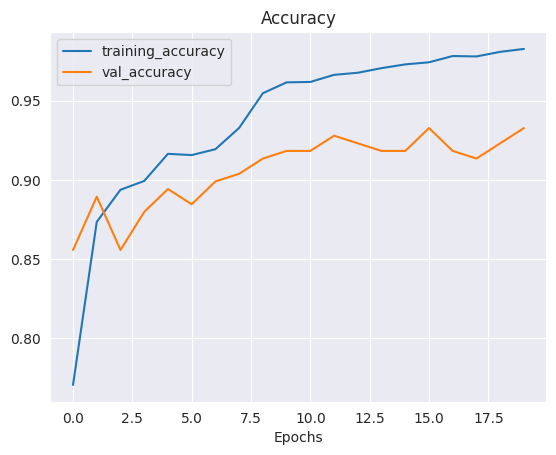

In [30]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 1s 49ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.98      0.95        53
           1       1.00      1.00      1.00        56
           2       0.86      0.82      0.84        51
           3       0.89      0.87      0.88        55

    accuracy                           0.92       215
   macro avg       0.92      0.92      0.92       215
weighted avg       0.92      0.92      0.92       215

Specificity: [0.31901840490797545, 0.3522012578616352, 0.24277456647398843, 0.2874251497005988]
Mean Squared Error: : 0.10355308651924133
The average AUC-ROC is 0.9873932464835864


[0.9937106918238994,
 0.6666666666666666,
 0.6867469879518072,
 0.6708074534161491,
 0.6477987421383647,
 1.0,
 0.6626506024096386,
 0.6521739130434783,
 0.6981132075471698,
 0.6792452830188679,
 0.9457831325301205,
 0.7204968944099379,
 0.660377358490566,
 0.6540880503144654,
 0.7048192771084337,
 0.9565217391304348]

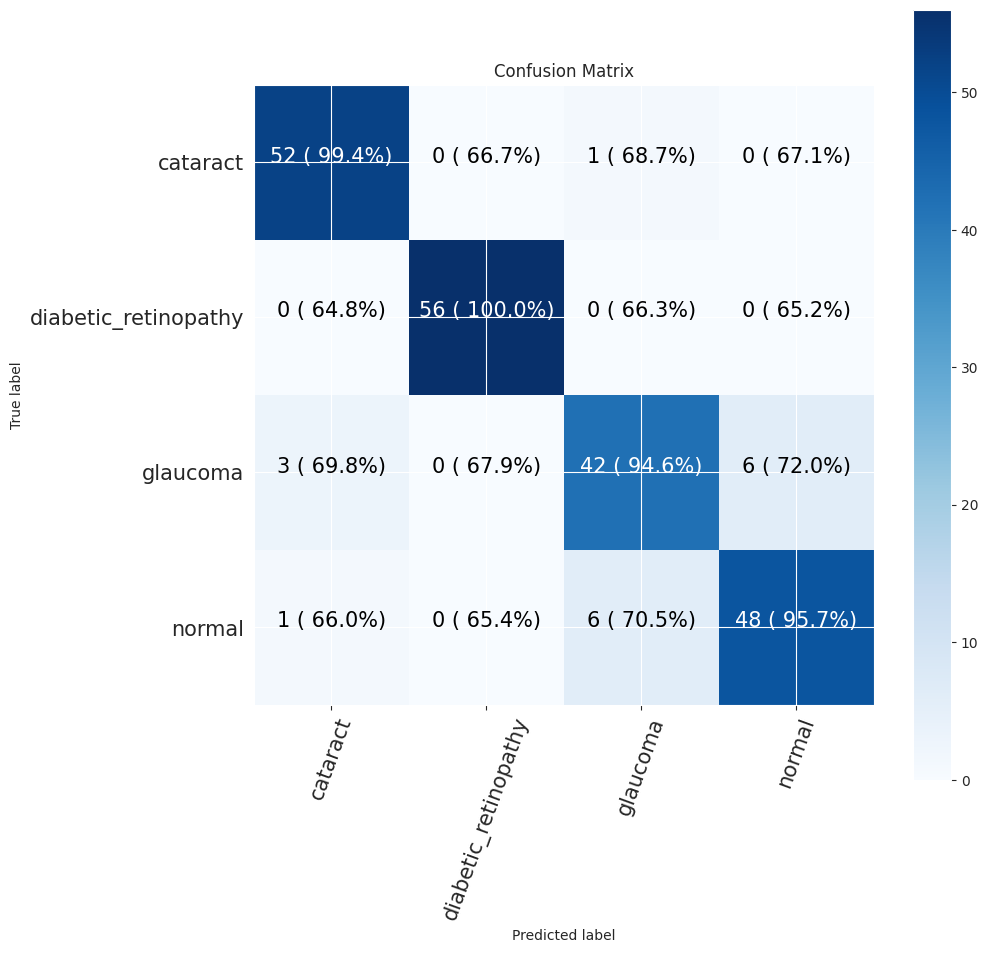

In [31]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


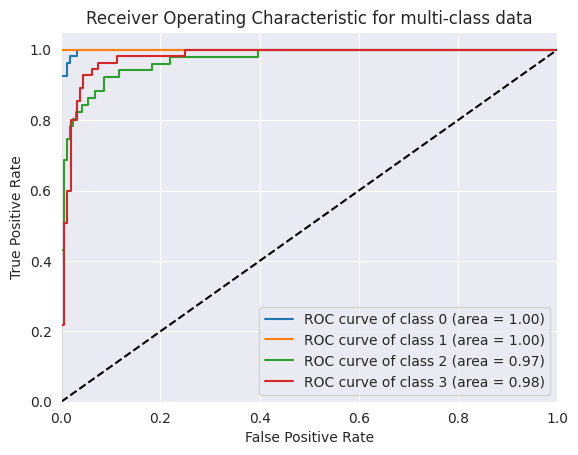

In [32]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [33]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [34]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

171446536/171446536 [==============================] - 1s 0us/step


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



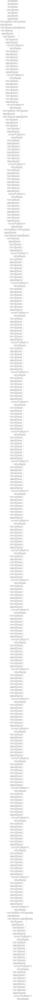

In [35]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [36]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_2  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_7 (Dense)             (None, 32)                65568     
                                                                 
 dense_8 (Dense)             (None, 4)                 132       
                                                                 
 activation_1 (Activation)   (None, 4)                 0   

In [37]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [38]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
238/238 [==============================] - 30s 99ms/step - loss: 0.4986 - accuracy: 0.8071 - val_loss: 0.3272 - val_accuracy: 0.8654 - lr: 0.0010
Epoch 2/20
238/238 [==============================] - 22s 92ms/step - loss: 0.3357 - accuracy: 0.8669 - val_loss: 0.2707 - val_accuracy: 0.8894 - lr: 0.0010
Epoch 3/20
238/238 [==============================] - 22s 91ms/step - loss: 0.2764 - accuracy: 0.8922 - val_loss: 0.2436 - val_accuracy: 0.8846 - lr: 0.0010
Epoch 4/20
238/238 [==============================] - 22s 90ms/step - loss: 0.2450 - accuracy: 0.9056 - val_loss: 0.2884 - val_accuracy: 0.8702 - lr: 0.0010
Epoch 5/20
238/238 [==============================] - 22s 91ms/step - loss: 0.2195 - accuracy: 0.9138 - val_loss: 0.2355 - val_accuracy: 0.8942 - lr: 0.0010
Epoch 6/20
238/238 [==============================] - 22s 91ms/step - loss: 0.2110 - accuracy: 0.9193 - val_loss: 0.2958 - val_accuracy: 0.8702 - lr: 0.0010
Epoch 7/20
238/238 [==============================] - 22s 

ResNet50 Evaluation

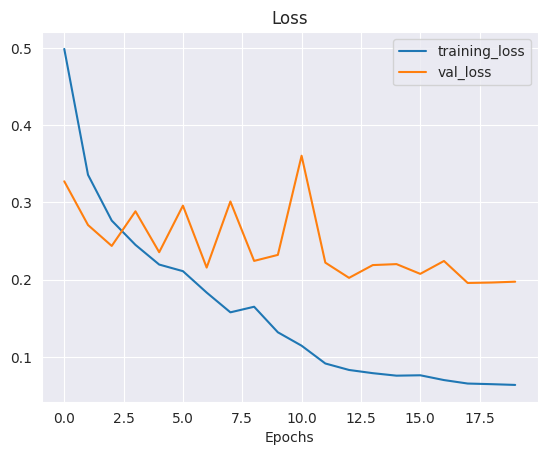

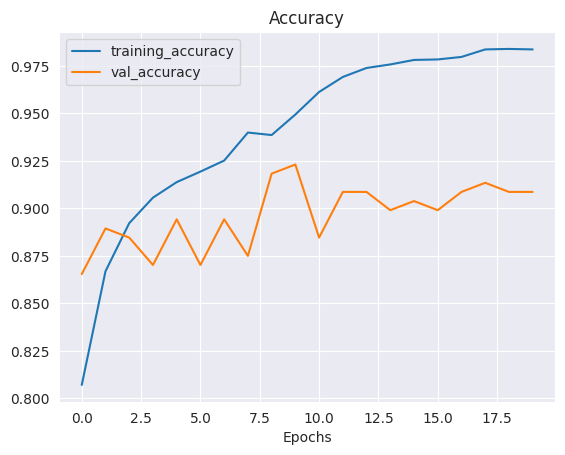

In [39]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 1s 81ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.92      0.95        53
           1       1.00      0.98      0.99        56
           2       0.85      0.92      0.89        51
           3       0.91      0.91      0.91        55

    accuracy                           0.93       215
   macro avg       0.94      0.93      0.93       215
weighted avg       0.94      0.93      0.94       215

Specificity: [0.29518072289156627, 0.34375, 0.27976190476190477, 0.30303030303030304]
Mean Squared Error: : 0.10585245490074158
The average AUC-ROC is 0.9891399131524884


[0.9757575757575757,
 0.66875,
 0.69375,
 0.66875,
 0.6606060606060606,
 0.99375,
 0.65,
 0.65625,
 0.6909090909090909,
 0.68125,
 0.975,
 0.70625,
 0.6727272727272727,
 0.65625,
 0.68125,
 0.96875]

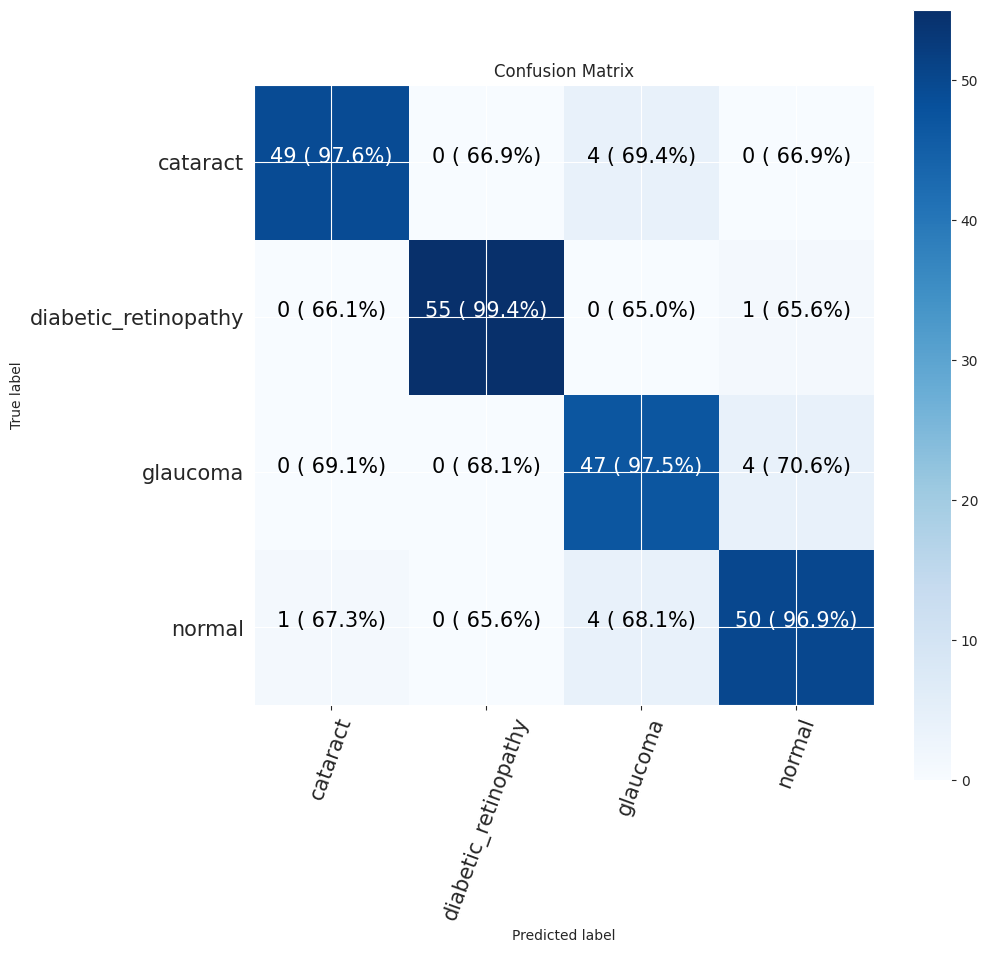

In [40]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


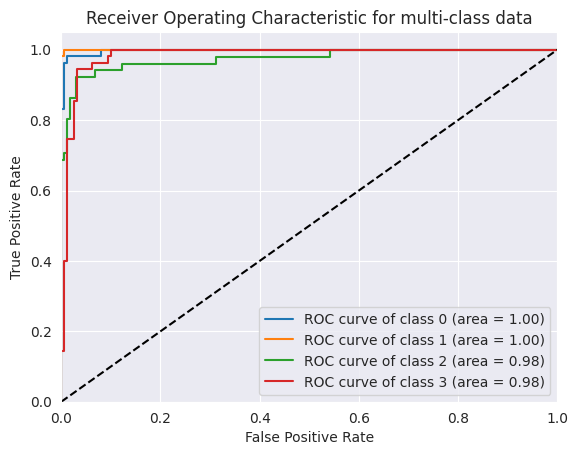

In [41]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **Batch size: 32**

In [42]:
epoch = 20
batchsize = 32

In [43]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3794 files belonging to 4 classes.
Found 215 files belonging to 4 classes.
Found 208 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [44]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [45]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_3  (None, 1536)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_9 (Dense)             (None, 32)                49184     
                                                                 
 dense_10 (Dense)            (None, 4)                 132       
                                                                 
 activation_2 (Activation)   (None, 4)                 0   

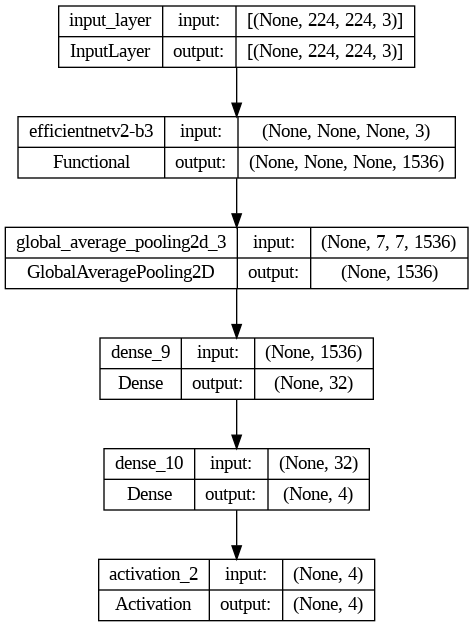

In [46]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [47]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [48]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
119/119 [==============================] - 27s 127ms/step - loss: 0.6172 - accuracy: 0.7541 - val_loss: 0.3755 - val_accuracy: 0.8654 - lr: 0.0010
Epoch 2/20
119/119 [==============================] - 11s 94ms/step - loss: 0.4256 - accuracy: 0.8382 - val_loss: 0.3615 - val_accuracy: 0.8750 - lr: 0.0010
Epoch 3/20
119/119 [==============================] - 11s 94ms/step - loss: 0.3722 - accuracy: 0.8558 - val_loss: 0.2970 - val_accuracy: 0.9038 - lr: 0.0010
Epoch 4/20
119/119 [==============================] - 11s 94ms/step - loss: 0.3517 - accuracy: 0.8672 - val_loss: 0.2490 - val_accuracy: 0.9087 - lr: 0.0010
Epoch 5/20
119/119 [==============================] - 11s 94ms/step - loss: 0.3093 - accuracy: 0.8795 - val_loss: 0.2208 - val_accuracy: 0.9327 - lr: 0.0010
Epoch 6/20
119/119 [==============================] - 11s 93ms/step - loss: 0.3029 - accuracy: 0.8872 - val_loss: 0.2289 - val_accuracy: 0.9231 - lr: 0.0010
Epoch 7/20
119/119 [==============================] - 11s

EfficientNetV2B3 Evaluation

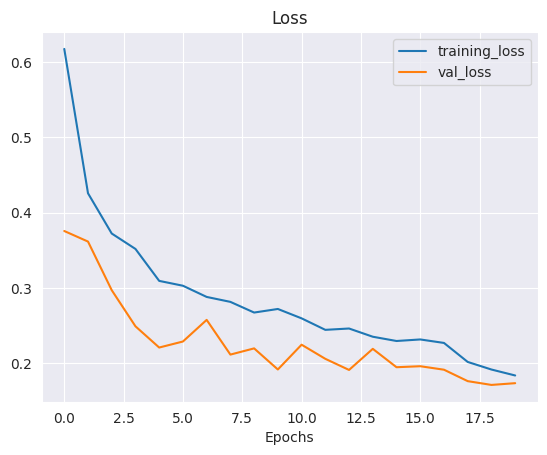

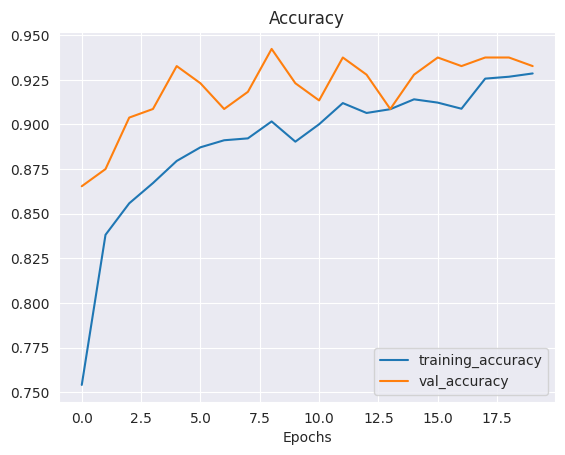

In [49]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 79ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.98      0.96        53
           1       1.00      1.00      1.00        56
           2       0.93      0.78      0.85        51
           3       0.87      0.96      0.91        55

    accuracy                           0.93       215
   macro avg       0.94      0.93      0.93       215
weighted avg       0.94      0.93      0.93       215

Specificity: [0.31901840490797545, 0.3522012578616352, 0.22857142857142856, 0.3271604938271605]
Mean Squared Error: : 0.10488103330135345
The average AUC-ROC is 0.9893172758231032


[0.99375,
 0.6666666666666666,
 0.6976744186046512,
 0.6558441558441559,
 0.65,
 1.0,
 0.6744186046511628,
 0.6363636363636364,
 0.7,
 0.6792452830188679,
 0.936046511627907,
 0.7207792207792207,
 0.65625,
 0.6540880503144654,
 0.6918604651162791,
 0.987012987012987]

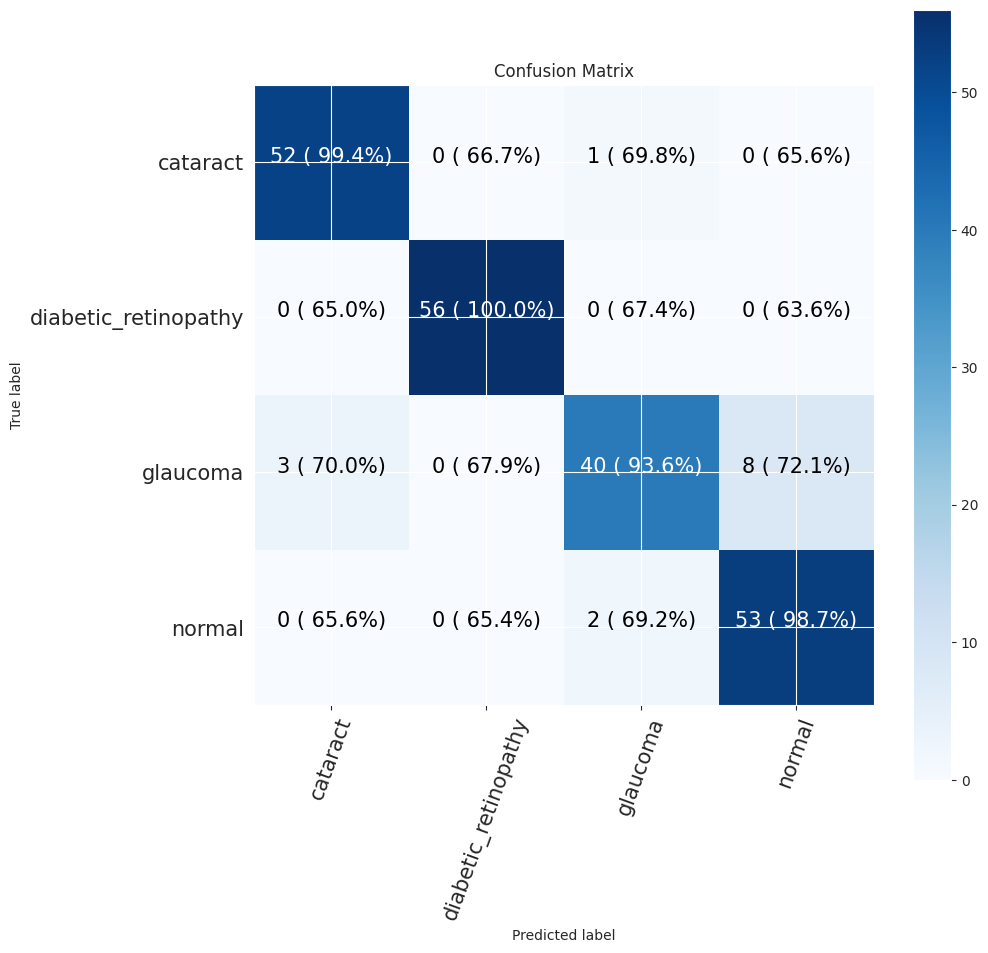

In [50]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


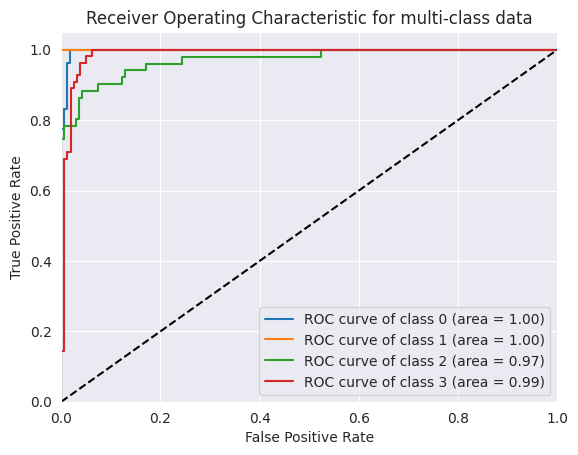

In [51]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [52]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# rbg = layers.Input(shape=(224, 224, 3))

# rbg = data_aug(rbg)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes


# Display model summary
cnn_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 26, 26, 128)      

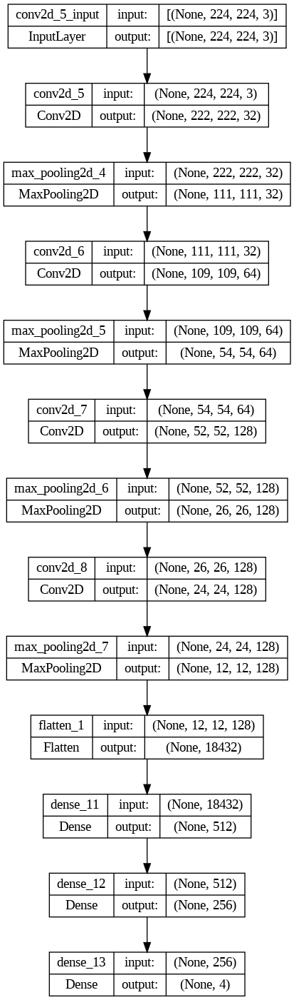

In [53]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [54]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [55]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
119/119 [==============================] - 11s 61ms/step - loss: 0.6427 - accuracy: 0.6234 - val_loss: 0.2779 - val_accuracy: 0.7692 - lr: 0.0010
Epoch 2/20
119/119 [==============================] - 6s 50ms/step - loss: 0.2406 - accuracy: 0.7855 - val_loss: 0.2664 - val_accuracy: 0.7692 - lr: 0.0010
Epoch 3/20
119/119 [==============================] - 6s 50ms/step - loss: 0.2180 - accuracy: 0.8081 - val_loss: 0.2384 - val_accuracy: 0.7933 - lr: 0.0010
Epoch 4/20
119/119 [==============================] - 6s 50ms/step - loss: 0.1945 - accuracy: 0.8329 - val_loss: 0.2238 - val_accuracy: 0.8173 - lr: 0.0010
Epoch 5/20
119/119 [==============================] - 6s 50ms/step - loss: 0.1858 - accuracy: 0.8408 - val_loss: 0.2150 - val_accuracy: 0.7885 - lr: 0.0010
Epoch 6/20
119/119 [==============================] - 6s 50ms/step - loss: 0.1686 - accuracy: 0.8643 - val_loss: 0.2066 - val_accuracy: 0.8029 - lr: 0.0010
Epoch 7/20
119/119 [==============================] - 6s 50ms/s

CNN Evaluation

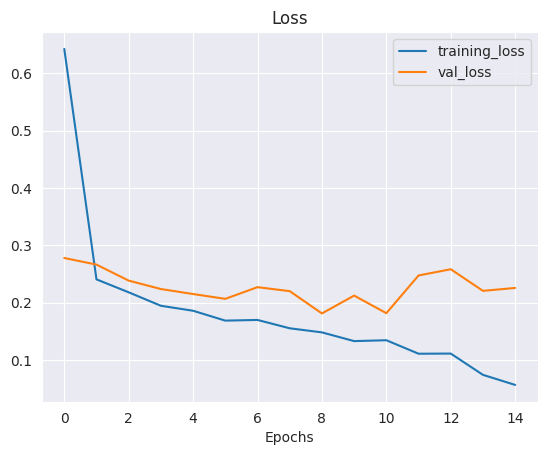

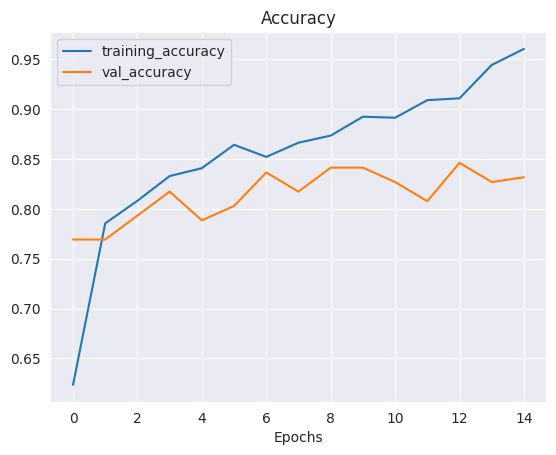

In [56]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 18ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.89      0.90        53
           1       0.98      1.00      0.99        56
           2       0.75      0.78      0.77        51
           3       0.83      0.80      0.81        55

    accuracy                           0.87       215
   macro avg       0.87      0.87      0.87       215
weighted avg       0.87      0.87      0.87       215

Specificity: [0.27976190476190477, 0.3522012578616352, 0.22857142857142856, 0.2573099415204678]
Mean Squared Error: : 0.11046202480792999
The average AUC-ROC is 0.9709829882160959


[0.9631901840490797,
 0.6645569620253164,
 0.6975308641975309,
 0.6851851851851852,
 0.656441717791411,
 1.0,
 0.654320987654321,
 0.654320987654321,
 0.7116564417177914,
 0.6772151898734177,
 0.9320987654320988,
 0.7283950617283951,
 0.6687116564417178,
 0.6582278481012658,
 0.7160493827160493,
 0.9320987654320988]

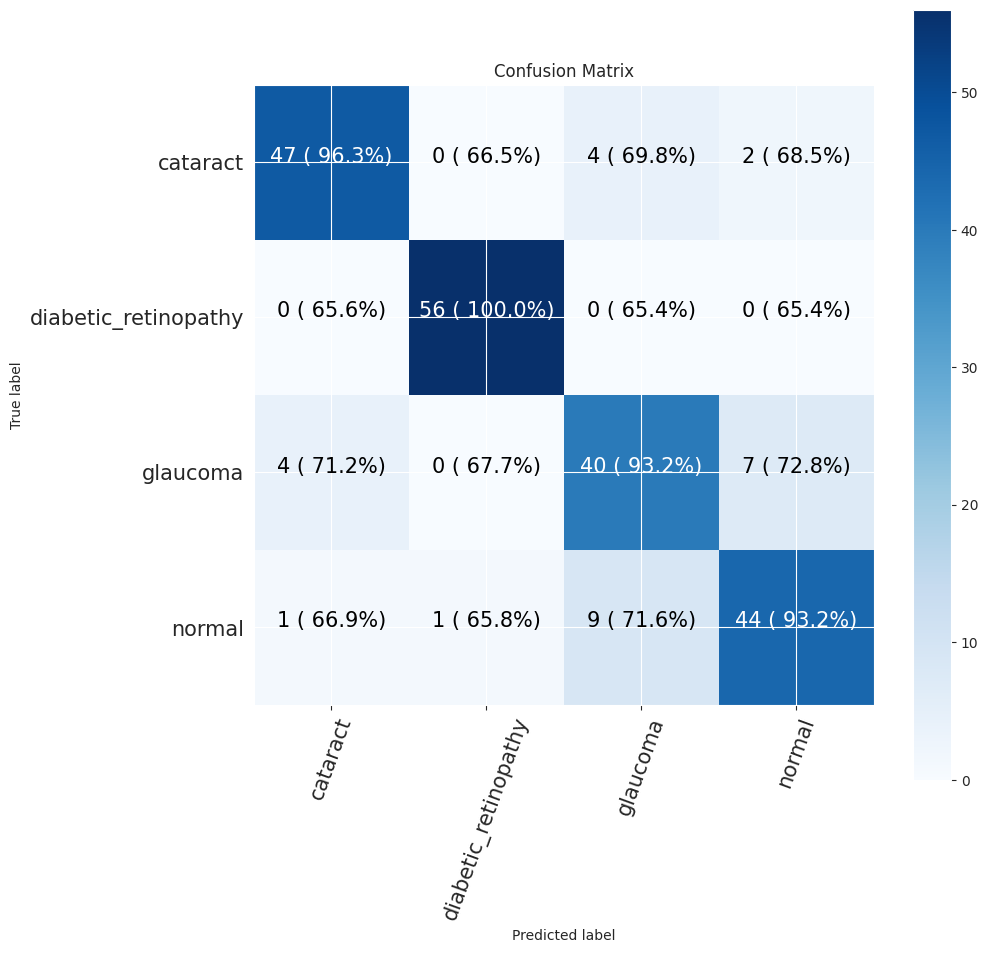

In [57]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


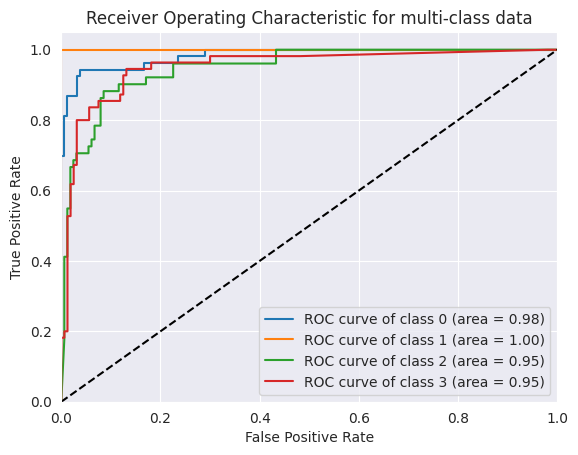

In [58]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [59]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [60]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

input = layers.Input(shape=(224, 224, 3))

conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_9 (Conv2D)           (None, 224, 224, 3)       84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_4  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_14 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_15 (Dense)            (None, 4)                 4100      
                                                           

In [61]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

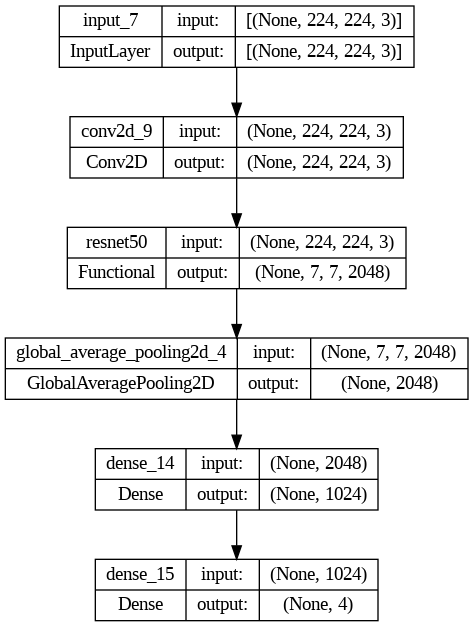

In [62]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [63]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [64]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
119/119 [==============================] - 44s 291ms/step - loss: 0.2745 - accuracy: 0.7783 - val_loss: 0.2245 - val_accuracy: 0.8317 - lr: 0.0010
Epoch 2/20
119/119 [==============================] - 31s 255ms/step - loss: 0.1567 - accuracy: 0.8801 - val_loss: 0.1599 - val_accuracy: 0.8606 - lr: 0.0010
Epoch 3/20
119/119 [==============================] - 30s 254ms/step - loss: 0.1225 - accuracy: 0.9051 - val_loss: 0.1119 - val_accuracy: 0.8990 - lr: 0.0010
Epoch 4/20
119/119 [==============================] - 31s 255ms/step - loss: 0.1032 - accuracy: 0.9238 - val_loss: 0.1157 - val_accuracy: 0.9231 - lr: 0.0010
Epoch 5/20
119/119 [==============================] - 31s 255ms/step - loss: 0.0999 - accuracy: 0.9257 - val_loss: 0.1226 - val_accuracy: 0.9038 - lr: 0.0010
Epoch 6/20
119/119 [==============================] - 31s 255ms/step - loss: 0.0831 - accuracy: 0.9412 - val_loss: 0.1465 - val_accuracy: 0.8750 - lr: 0.0010
Epoch 7/20
119/119 [==============================] 

ResNet50 Evaluation

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 92ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.96      0.94        53
           1       1.00      0.98      0.99        56
           2       0.87      0.80      0.84        51
           3       0.88      0.93      0.90        55

    accuracy                           0.92       215
   macro avg       0.92      0.92      0.92       215
weighted avg       0.92      0.92      0.92       215

Specificity: [0.31097560975609756, 0.34375, 0.23563218390804597, 0.31097560975609756]
Mean Squared Error: : 0.10377256572246552
The average AUC-ROC is 0.9875107766939675


[0.9875,
 0.66875,
 0.6964285714285714,
 0.6624203821656051,
 0.65,
 0.99375,
 0.6666666666666666,
 0.6496815286624203,
 0.70625,
 0.68125,
 0.9404761904761905,
 0.7133757961783439,
 0.65625,
 0.65625,
 0.6964285714285714,
 0.9745222929936306]

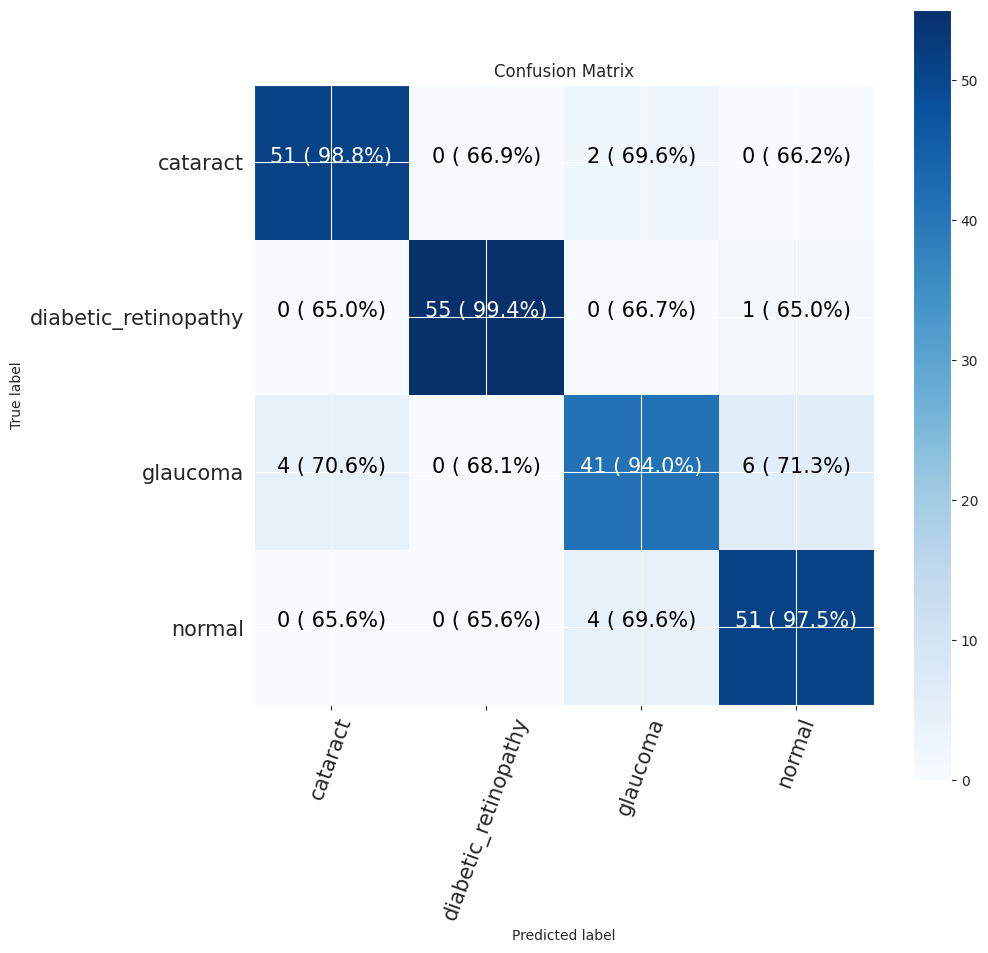

In [65]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


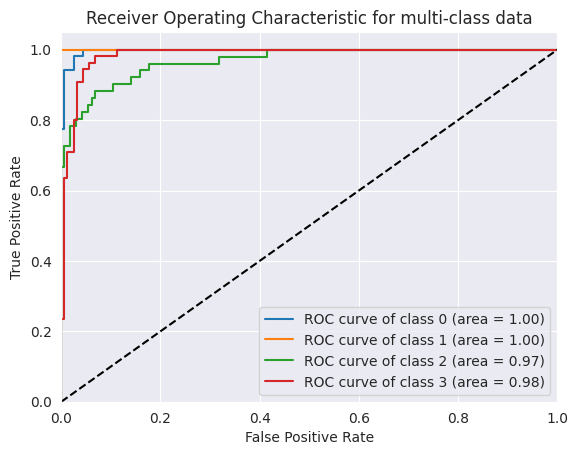

In [66]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [67]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [68]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



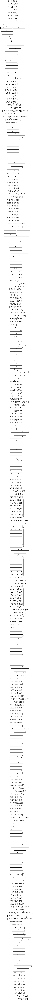

In [69]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [70]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_5  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_16 (Dense)            (None, 32)                65568     
                                                                 
 dense_17 (Dense)            (None, 4)                 132       
                                                                 
 activation_3 (Activation)   (None, 4)                 0   

In [71]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [72]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
119/119 [==============================] - 29s 194ms/step - loss: 0.5924 - accuracy: 0.7657 - val_loss: 0.3737 - val_accuracy: 0.8269 - lr: 0.0010
Epoch 2/20
119/119 [==============================] - 21s 176ms/step - loss: 0.3607 - accuracy: 0.8624 - val_loss: 0.2712 - val_accuracy: 0.8942 - lr: 0.0010
Epoch 3/20
119/119 [==============================] - 21s 172ms/step - loss: 0.3006 - accuracy: 0.8861 - val_loss: 0.2707 - val_accuracy: 0.8798 - lr: 0.0010
Epoch 4/20
119/119 [==============================] - 20s 171ms/step - loss: 0.2603 - accuracy: 0.9001 - val_loss: 0.2795 - val_accuracy: 0.9087 - lr: 0.0010
Epoch 5/20
119/119 [==============================] - 21s 171ms/step - loss: 0.2311 - accuracy: 0.9120 - val_loss: 0.2138 - val_accuracy: 0.9375 - lr: 0.0010
Epoch 6/20
119/119 [==============================] - 21s 171ms/step - loss: 0.1998 - accuracy: 0.9233 - val_loss: 0.2243 - val_accuracy: 0.9135 - lr: 0.0010
Epoch 7/20
119/119 [==============================] 

ResNet50 Evaluation

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 159ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96        53
           1       1.00      0.96      0.98        56
           2       0.91      0.84      0.88        51
           3       0.85      0.95      0.90        55

    accuracy                           0.93       215
   macro avg       0.93      0.93      0.93       215
weighted avg       0.93      0.93      0.93       215

Specificity: [0.31097560975609756, 0.33540372670807456, 0.25, 0.31901840490797545]
Mean Squared Error: : 0.10633540153503418
The average AUC-ROC is 0.9889679776931606


[0.9876543209876543,
 0.6708074534161491,
 0.6964285714285714,
 0.6558441558441559,
 0.654320987654321,
 0.9875776397515528,
 0.6666666666666666,
 0.6493506493506493,
 0.691358024691358,
 0.6832298136645962,
 0.9523809523809523,
 0.7142857142857143,
 0.6666666666666666,
 0.6583850931677019,
 0.6845238095238095,
 0.9805194805194806]

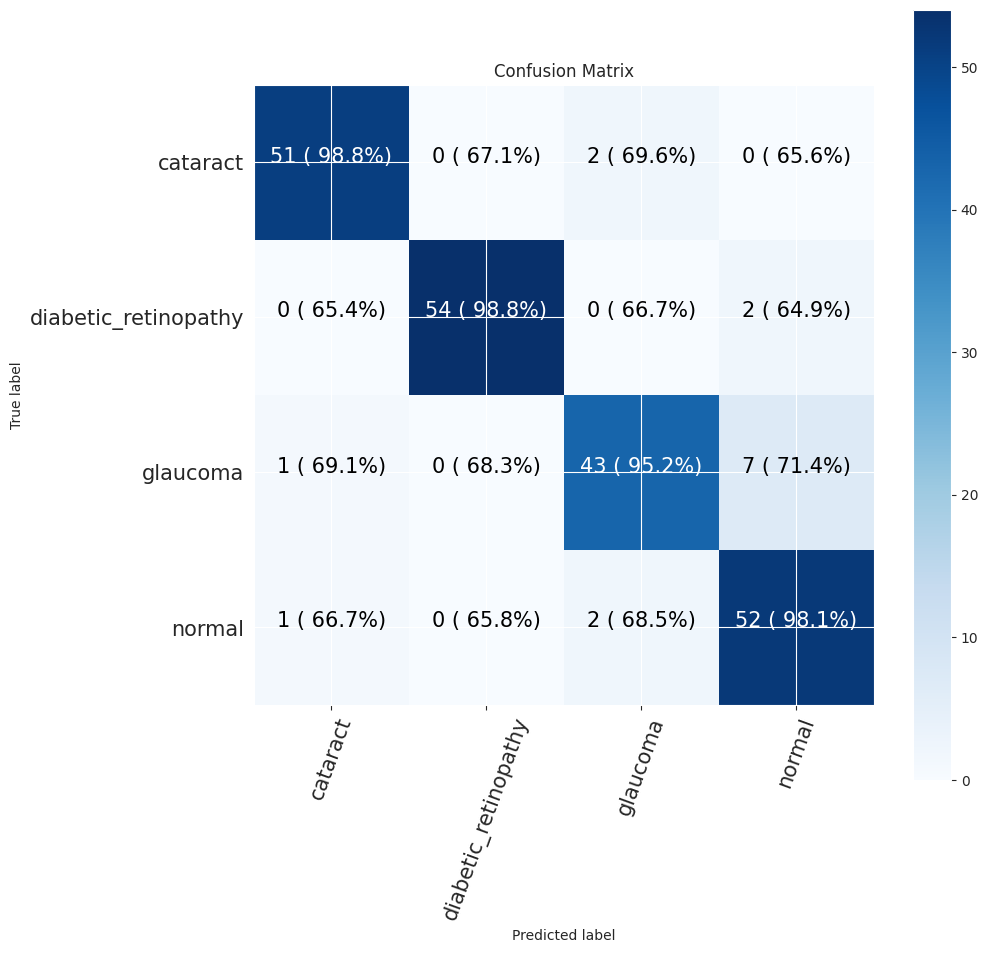

In [73]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


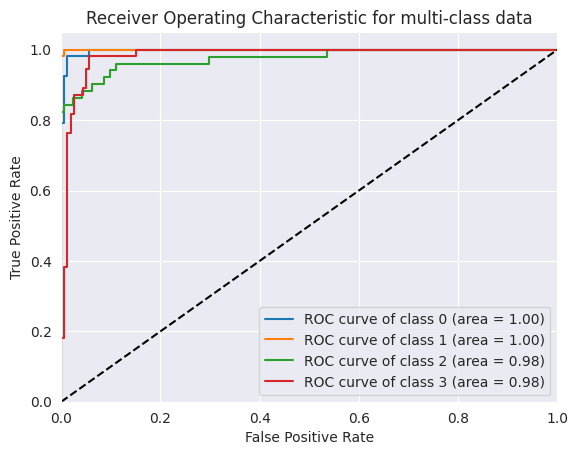

In [74]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **Batch size: 64**

In [75]:
epoch = 20
batchsize = 64

In [76]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3794 files belonging to 4 classes.
Found 215 files belonging to 4 classes.
Found 208 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [77]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [78]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_6  (None, 1536)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_18 (Dense)            (None, 32)                49184     
                                                                 
 dense_19 (Dense)            (None, 4)                 132       
                                                                 
 activation_4 (Activation)   (None, 4)                 0   

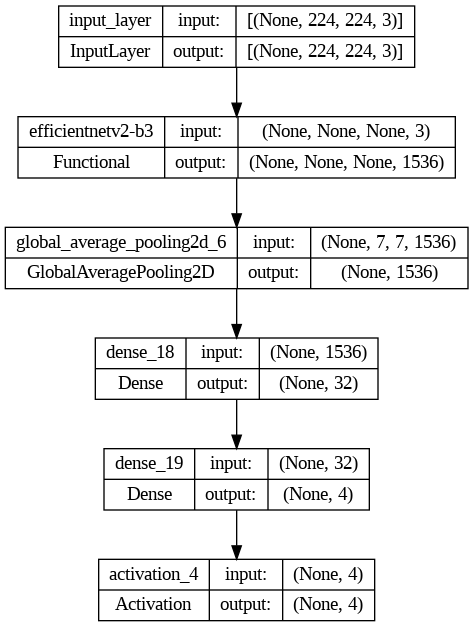

In [79]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [80]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [81]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
60/60 [==============================] - 27s 242ms/step - loss: 0.6960 - accuracy: 0.7243 - val_loss: 0.4026 - val_accuracy: 0.8558 - lr: 0.0010
Epoch 2/20
60/60 [==============================] - 11s 179ms/step - loss: 0.4388 - accuracy: 0.8382 - val_loss: 0.3199 - val_accuracy: 0.8942 - lr: 0.0010
Epoch 3/20
60/60 [==============================] - 11s 180ms/step - loss: 0.3868 - accuracy: 0.8548 - val_loss: 0.2889 - val_accuracy: 0.8942 - lr: 0.0010
Epoch 4/20
60/60 [==============================] - 11s 180ms/step - loss: 0.3662 - accuracy: 0.8640 - val_loss: 0.2742 - val_accuracy: 0.8990 - lr: 0.0010
Epoch 5/20
60/60 [==============================] - 11s 178ms/step - loss: 0.3452 - accuracy: 0.8695 - val_loss: 0.2502 - val_accuracy: 0.9087 - lr: 0.0010
Epoch 6/20
60/60 [==============================] - 11s 176ms/step - loss: 0.3247 - accuracy: 0.8753 - val_loss: 0.2357 - val_accuracy: 0.9279 - lr: 0.0010
Epoch 7/20
60/60 [==============================] - 11s 177ms/st

EfficientNetV2B3 Evaluation

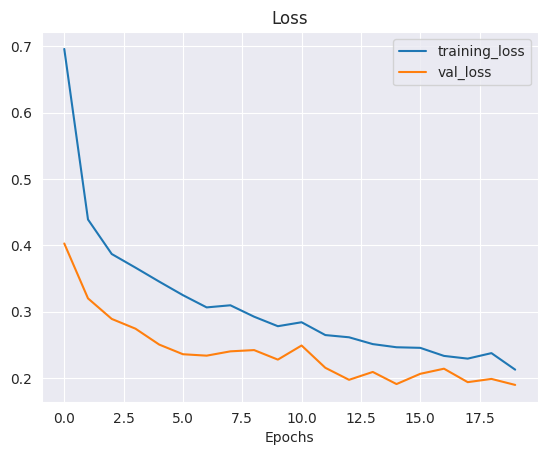

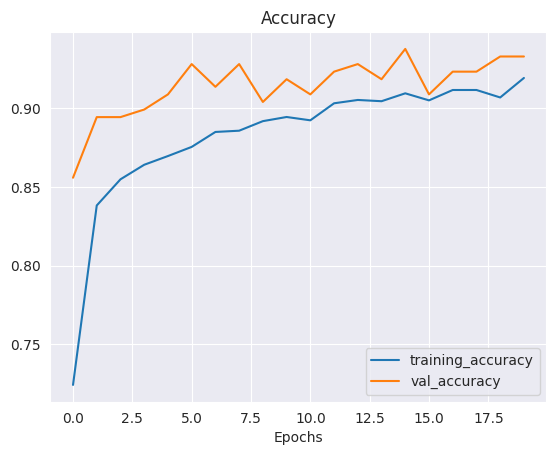

In [82]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


4/4 [==============================] - 1s 151ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.98      0.95        53
           1       1.00      0.98      0.99        56
           2       0.93      0.76      0.84        51
           3       0.87      0.96      0.91        55

    accuracy                           0.93       215
   macro avg       0.93      0.92      0.92       215
weighted avg       0.93      0.93      0.92       215

Specificity: [0.31901840490797545, 0.34375, 0.2215909090909091, 0.3271604938271605]
Mean Squared Error: : 0.10661906003952026
The average AUC-ROC is 0.9871178934116314


[0.9936708860759493,
 0.66875,
 0.6994219653179191,
 0.6558441558441559,
 0.6455696202531646,
 0.99375,
 0.6763005780346821,
 0.6428571428571429,
 0.7088607594936709,
 0.68125,
 0.930635838150289,
 0.7142857142857143,
 0.6518987341772152,
 0.65625,
 0.6936416184971098,
 0.987012987012987]

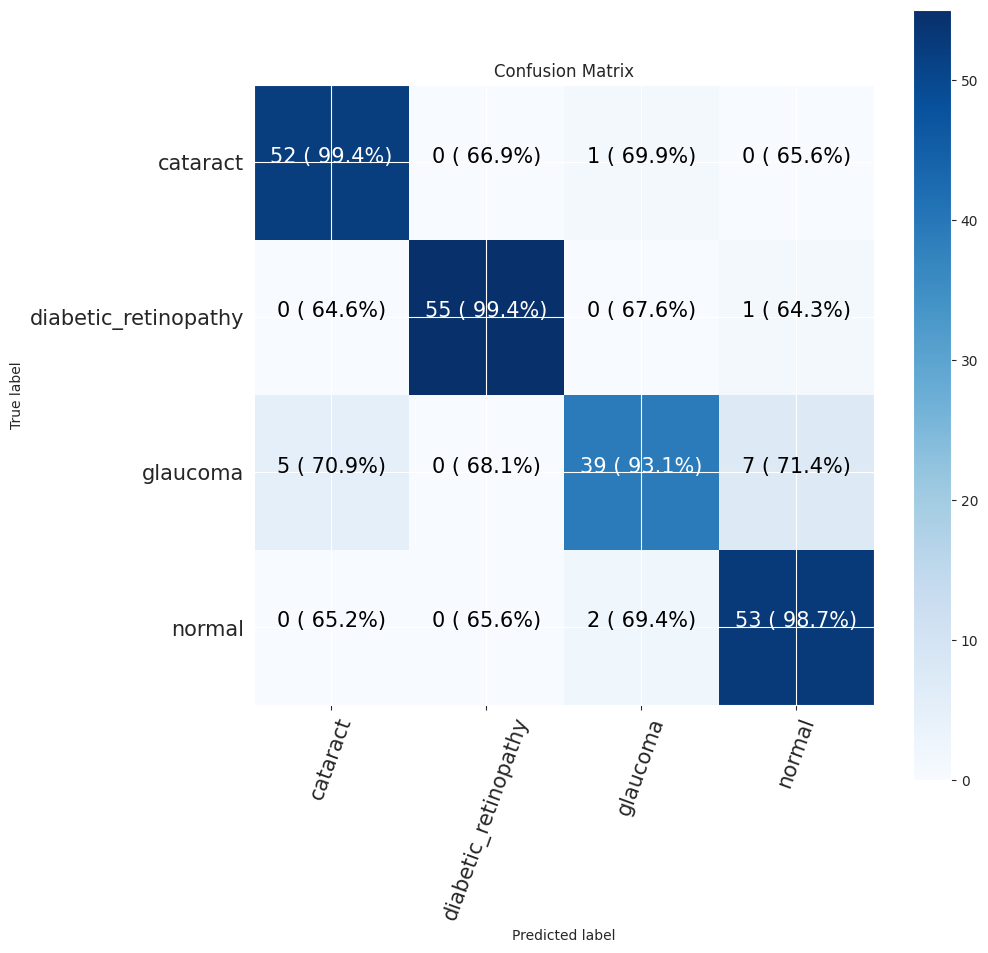

In [83]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


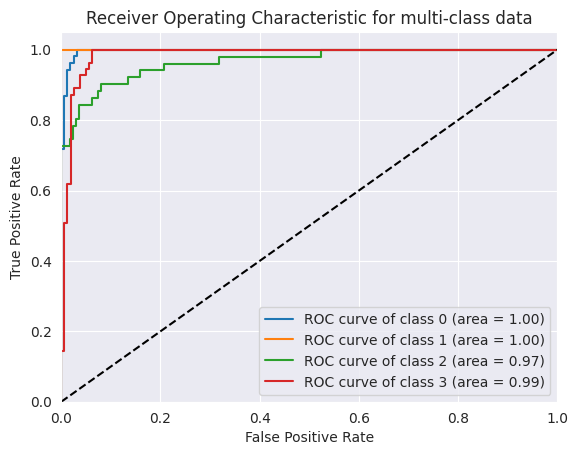

In [84]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [85]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# rbg = layers.Input(shape=(224, 224, 3))

# rbg = data_aug(rbg)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes


# Display model summary
cnn_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_12 (Conv2D)          (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 26, 26, 128)      

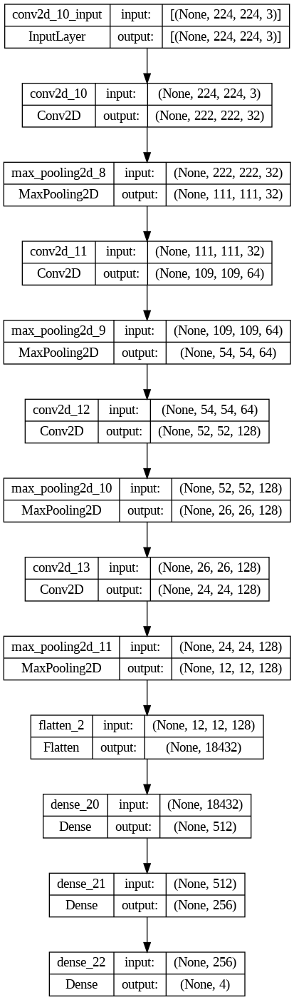

In [86]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [87]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [88]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
60/60 [==============================] - 12s 98ms/step - loss: 2.5532 - accuracy: 0.5430 - val_loss: 0.3487 - val_accuracy: 0.6683 - lr: 0.0010
Epoch 2/20
60/60 [==============================] - 6s 96ms/step - loss: 0.3039 - accuracy: 0.7198 - val_loss: 0.2630 - val_accuracy: 0.7356 - lr: 0.0010
Epoch 3/20
60/60 [==============================] - 6s 96ms/step - loss: 0.2392 - accuracy: 0.7905 - val_loss: 0.2137 - val_accuracy: 0.8317 - lr: 0.0010
Epoch 4/20
60/60 [==============================] - 6s 97ms/step - loss: 0.2238 - accuracy: 0.8036 - val_loss: 0.2372 - val_accuracy: 0.8029 - lr: 0.0010
Epoch 5/20
60/60 [==============================] - 6s 96ms/step - loss: 0.2049 - accuracy: 0.8247 - val_loss: 0.2305 - val_accuracy: 0.8125 - lr: 0.0010
Epoch 6/20
60/60 [==============================] - 6s 96ms/step - loss: 0.1922 - accuracy: 0.8329 - val_loss: 0.3196 - val_accuracy: 0.7260 - lr: 0.0010
Epoch 7/20
60/60 [==============================] - 6s 96ms/step - loss: 0.

CNN Evaluation

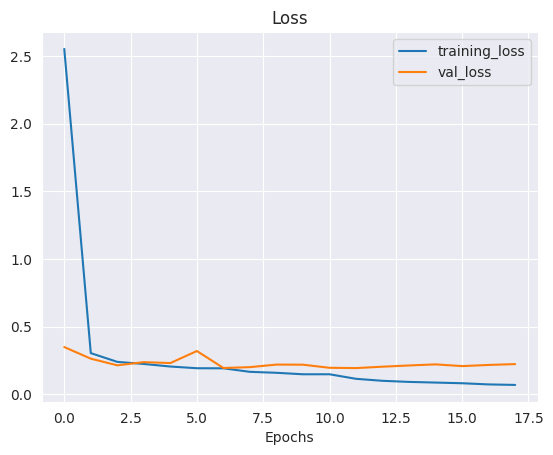

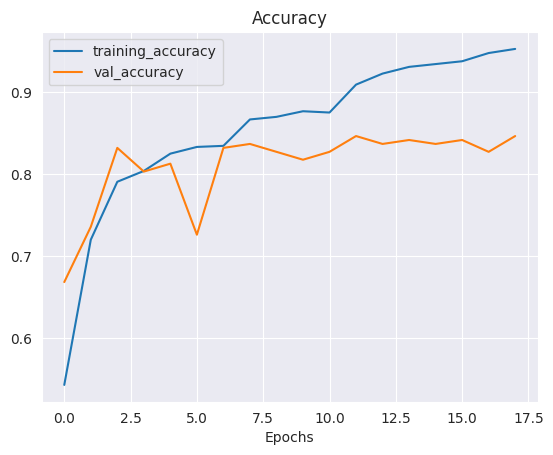

In [89]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


4/4 [==============================] - 0s 33ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.91      0.89        53
           1       0.98      1.00      0.99        56
           2       0.83      0.78      0.81        51
           3       0.80      0.80      0.80        55

    accuracy                           0.87       215
   macro avg       0.87      0.87      0.87       215
weighted avg       0.87      0.87      0.87       215

Specificity: [0.2874251497005988, 0.3522012578616352, 0.22857142857142856, 0.2573099415204678]
Mean Squared Error: : 0.11138357222080231
The average AUC-ROC is 0.9628349289394901


[0.96875,
 0.6645569620253164,
 0.688622754491018,
 0.69375,
 0.65,
 1.0,
 0.6646706586826348,
 0.65,
 0.70625,
 0.6772151898734177,
 0.9341317365269461,
 0.725,
 0.675,
 0.6582278481012658,
 0.7125748502994012,
 0.93125]

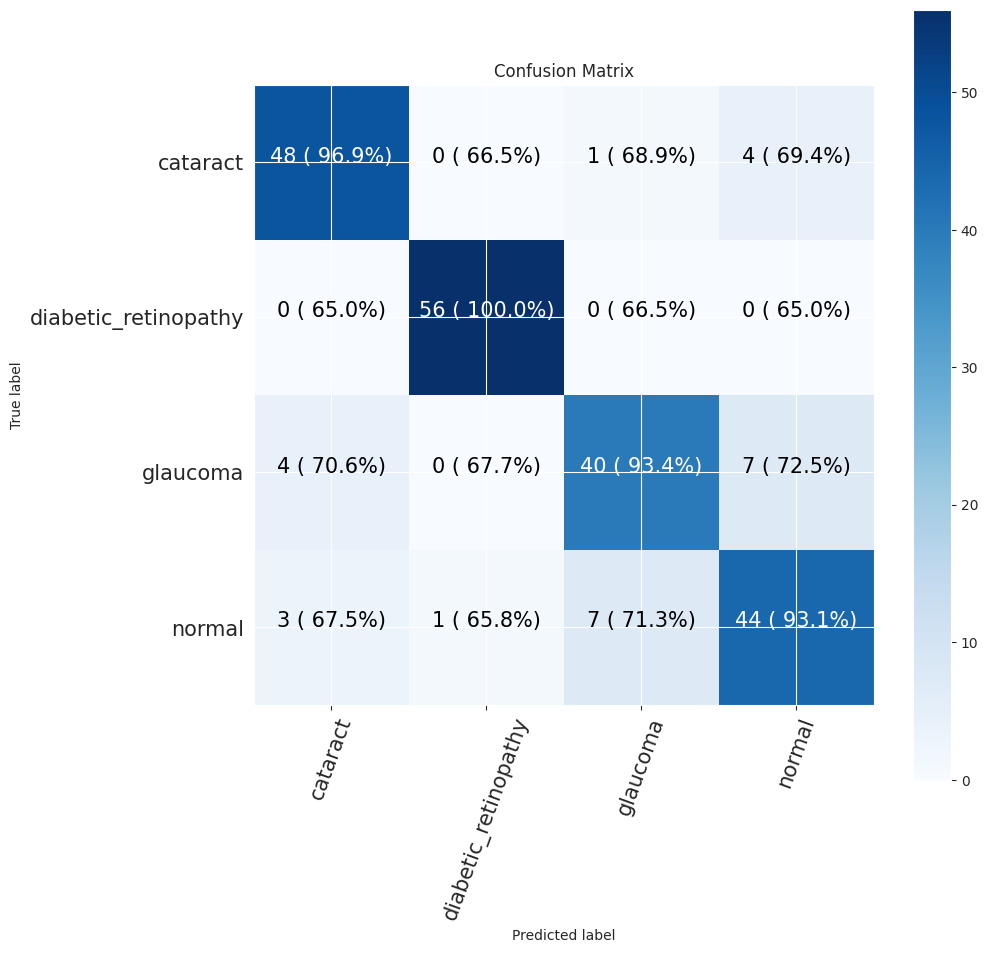

In [90]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


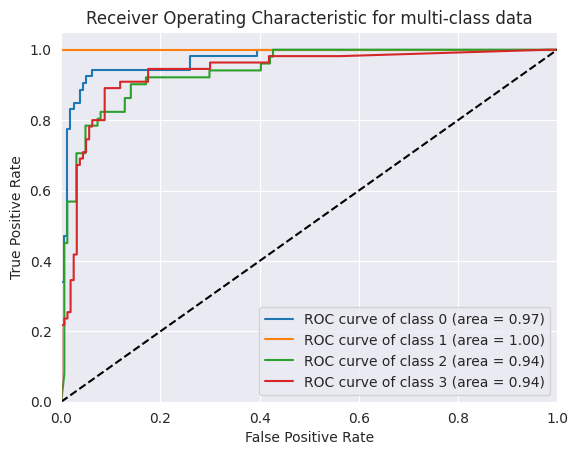

In [91]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [92]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [93]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

input = layers.Input(shape=(224, 224, 3))

conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_14 (Conv2D)          (None, 224, 224, 3)       84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_7  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_23 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_24 (Dense)            (None, 4)                 4100      
                                                           

In [94]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

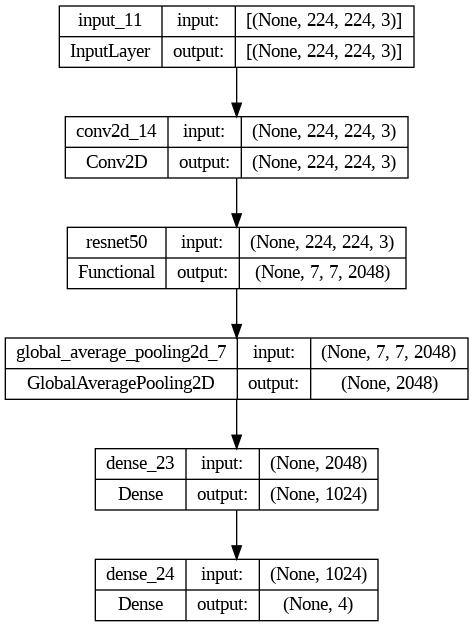

In [95]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [96]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [97]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
60/60 [==============================] - 42s 513ms/step - loss: 0.3365 - accuracy: 0.7475 - val_loss: 0.2064 - val_accuracy: 0.8413 - lr: 0.0010
Epoch 2/20
60/60 [==============================] - 30s 492ms/step - loss: 0.1783 - accuracy: 0.8574 - val_loss: 0.1675 - val_accuracy: 0.8558 - lr: 0.0010
Epoch 3/20
60/60 [==============================] - 30s 492ms/step - loss: 0.1452 - accuracy: 0.8896 - val_loss: 0.1476 - val_accuracy: 0.8750 - lr: 0.0010
Epoch 4/20
60/60 [==============================] - 30s 495ms/step - loss: 0.1390 - accuracy: 0.8996 - val_loss: 0.1500 - val_accuracy: 0.8702 - lr: 0.0010
Epoch 5/20
60/60 [==============================] - 30s 499ms/step - loss: 0.1176 - accuracy: 0.9083 - val_loss: 0.1366 - val_accuracy: 0.9087 - lr: 0.0010
Epoch 6/20
60/60 [==============================] - 30s 490ms/step - loss: 0.1029 - accuracy: 0.9228 - val_loss: 0.1329 - val_accuracy: 0.8798 - lr: 0.0010
Epoch 7/20
60/60 [==============================] - 30s 492ms/st

ResNet50 Evaluation

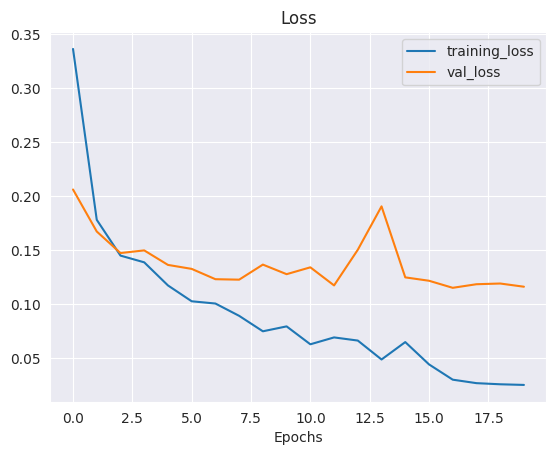

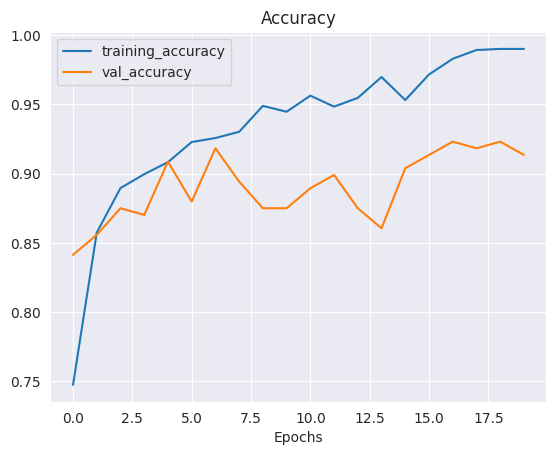

In [98]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


4/4 [==============================] - 1s 181ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97        53
           1       1.00      1.00      1.00        56
           2       0.96      0.86      0.91        51
           3       0.92      0.98      0.95        55

    accuracy                           0.96       215
   macro avg       0.96      0.96      0.96       215
weighted avg       0.96      0.96      0.96       215

Specificity: [0.31901840490797545, 0.3522012578616352, 0.2573099415204678, 0.33540372670807456]
Mean Squared Error: : 0.10041897743940353
The average AUC-ROC is 0.9890365873824463


[0.9937888198757764,
 0.6666666666666666,
 0.6923076923076923,
 0.6602564102564102,
 0.6521739130434783,
 1.0,
 0.6686390532544378,
 0.6410256410256411,
 0.6956521739130435,
 0.6792452830188679,
 0.9585798816568047,
 0.7051282051282052,
 0.6583850931677019,
 0.6540880503144654,
 0.6804733727810651,
 0.9935897435897436]

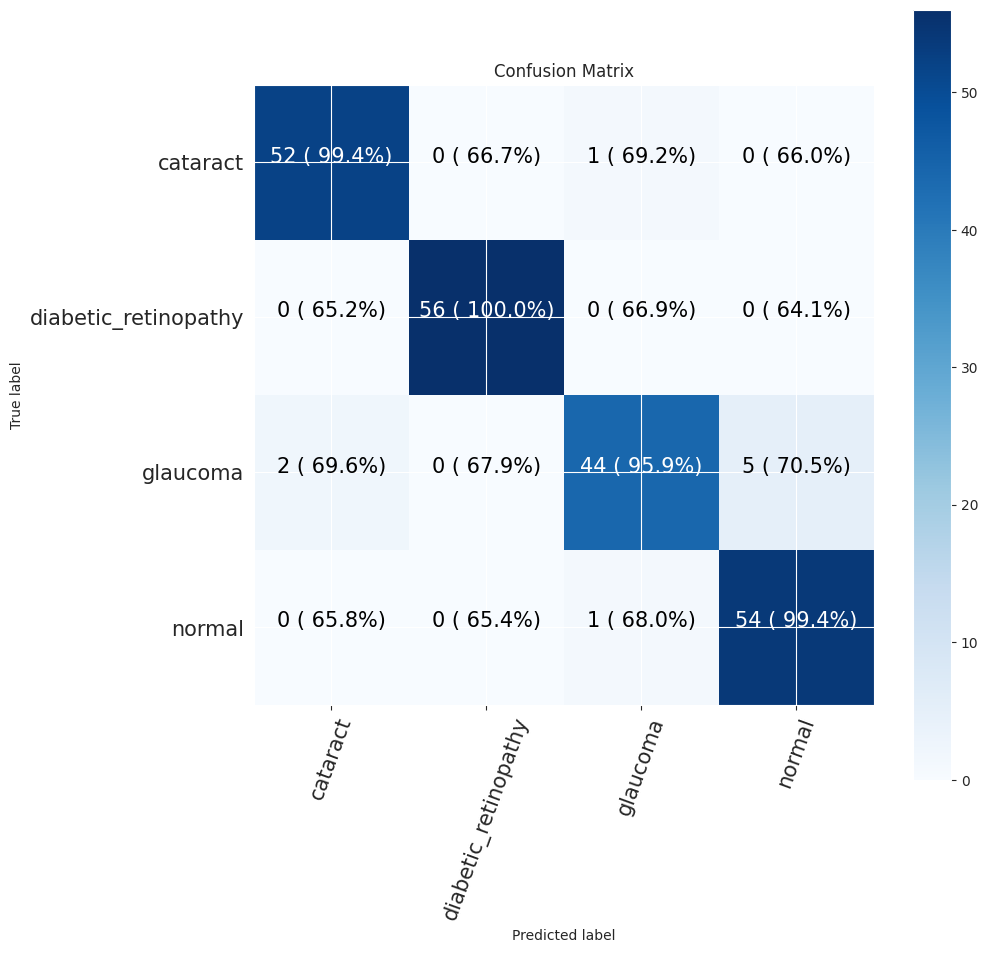

In [99]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


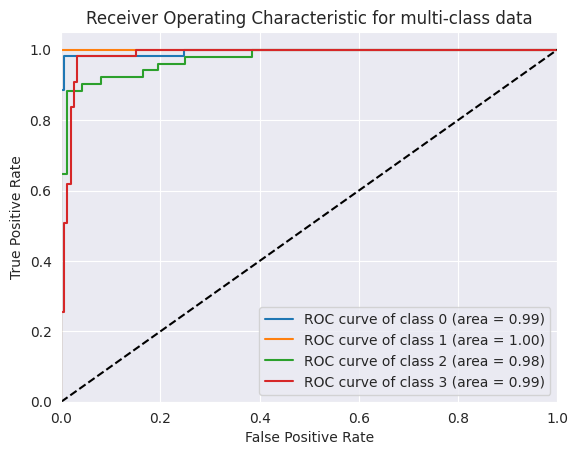

In [100]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [101]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [102]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



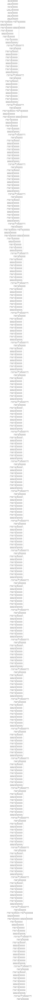

In [103]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [104]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
# x = data_aug(inputs)
x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_8  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_25 (Dense)            (None, 32)                65568     
                                                                 
 dense_26 (Dense)            (None, 4)                 132       
                                                                 
 activation_5 (Activation)   (None, 4)                 0   

In [105]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [106]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
60/60 [==============================] - 29s 358ms/step - loss: 0.6294 - accuracy: 0.7478 - val_loss: 0.4495 - val_accuracy: 0.8125 - lr: 0.0010
Epoch 2/20
60/60 [==============================] - 21s 340ms/step - loss: 0.4002 - accuracy: 0.8482 - val_loss: 0.3204 - val_accuracy: 0.8942 - lr: 0.0010
Epoch 3/20
60/60 [==============================] - 20s 330ms/step - loss: 0.3390 - accuracy: 0.8687 - val_loss: 0.2881 - val_accuracy: 0.9038 - lr: 0.0010
Epoch 4/20
60/60 [==============================] - 20s 321ms/step - loss: 0.2902 - accuracy: 0.8917 - val_loss: 0.2731 - val_accuracy: 0.8990 - lr: 0.0010
Epoch 5/20
60/60 [==============================] - 20s 323ms/step - loss: 0.2584 - accuracy: 0.9030 - val_loss: 0.2332 - val_accuracy: 0.9231 - lr: 0.0010
Epoch 6/20
60/60 [==============================] - 20s 326ms/step - loss: 0.2311 - accuracy: 0.9125 - val_loss: 0.3107 - val_accuracy: 0.8846 - lr: 0.0010
Epoch 7/20
60/60 [==============================] - 20s 328ms/st

ResNet50 Evaluation

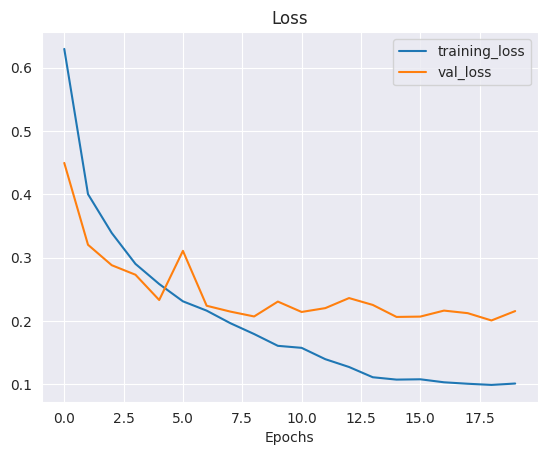

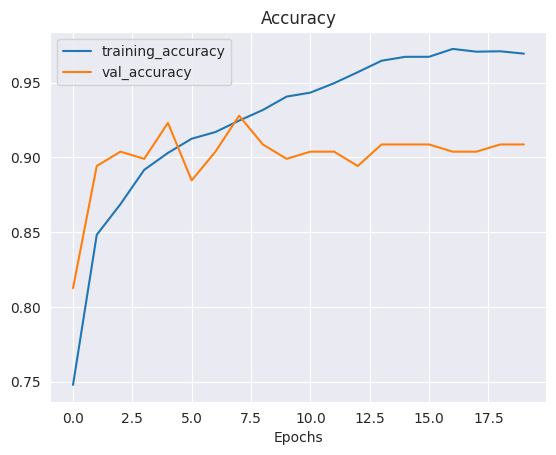

In [107]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


4/4 [==============================] - 1s 301ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.91      0.94        53
           1       1.00      0.95      0.97        56
           2       0.82      0.88      0.85        51
           3       0.84      0.89      0.87        55

    accuracy                           0.91       215
   macro avg       0.91      0.91      0.91       215
weighted avg       0.91      0.91      0.91       215

Specificity: [0.2874251497005988, 0.3271604938271605, 0.2647058823529412, 0.29518072289156627]
Mean Squared Error: : 0.10910944640636444
The average AUC-ROC is 0.9875925270316298


[0.9698795180722891,
 0.6728395061728395,
 0.7,
 0.6624203821656051,
 0.6626506024096386,
 0.9814814814814815,
 0.65,
 0.6624203821656051,
 0.6927710843373494,
 0.6851851851851852,
 0.9625,
 0.7133757961783439,
 0.6746987951807228,
 0.6604938271604939,
 0.6875,
 0.9617834394904459]

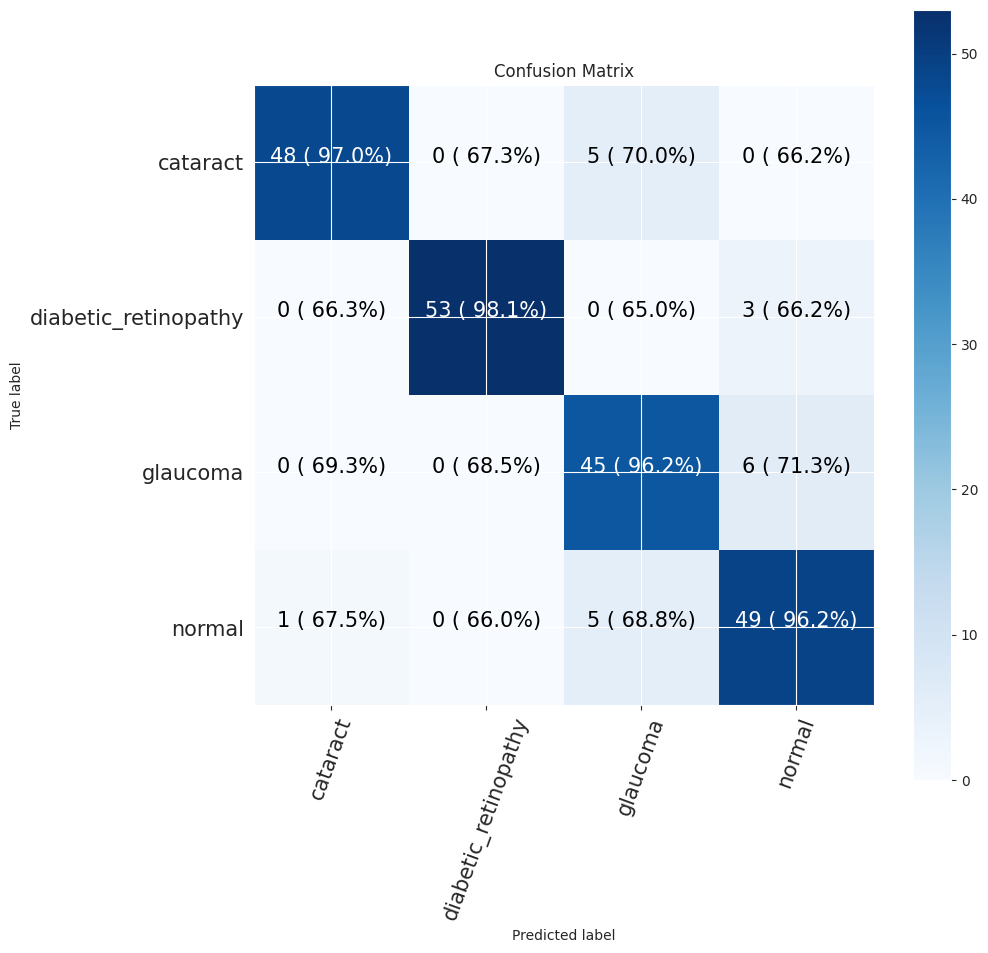

In [108]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


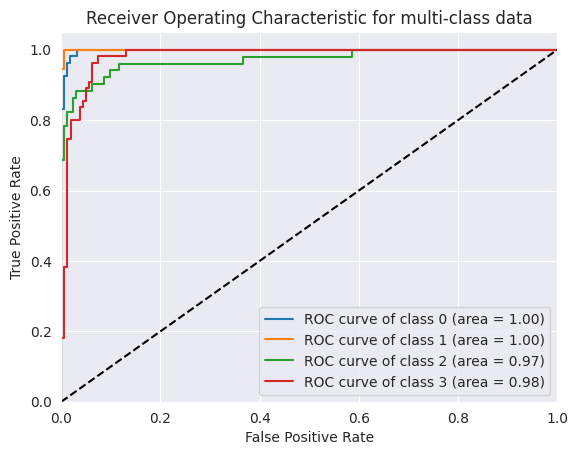

In [109]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()